In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
import torch
import contextlib
import io
import cv2
import matplotlib.pyplot as plt

from fvcore.common.file_io import PathManager
from pycocotools.coco import COCO

sys.path.append('../codes')

from detectron2.config import get_cfg
from detectron2.data import (DatasetCatalog, MetadataCatalog, build_detection_test_loader, get_detection_dataset_dicts)
from detectron2.data.datasets import register_coco_instances, load_coco_json
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import (COCOEvaluator, DatasetEvaluators, inference_on_dataset)
from detectron2.utils.visualizer import Visualizer, ColorMode

from detectron2.utils.logger import setup_logger
from utils.evaluation import CfnMat
from utils.img_utils import add_bboxes_on_image

from detectron2.structures.boxes import Boxes, BoxMode, pairwise_iou
from utils.register_datasets import register_mosquitoes

In [3]:
register_mosquitoes()

In [4]:
# for d in ["Train", "Test"]:
#     register_coco_instances(f"mbg_{d.lower()}", 
#                             {},
#                             f"../data/_under_construction/coco_format_{d}.json",
#                             f"../data/_under_construction/{d}")
#     MetadataCatalog.get(f"mbg_{d.lower()}").set(thing_classes=["tire"], thing_colors=[(255,0,0)])
    
    # dataset_dicts = load_coco_json("../data/_under_construction/coco_format_Test.json",
    #                                "../data/_under_construction/Test",
    #                                dataset_name="mbg_test", extra_annotation_keys=None)

    # dataset_dicts = get_detection_dataset_dicts([f"mbg_{d.lower()}"], filter_empty=True)    

In [5]:
k = 7
test_set = f"mbg_val{k}_tire"
dataset_dicts = get_detection_dataset_dicts([test_set], filter_empty=False)


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



In [6]:
model_name = "faster_rcnn_R_50_FPN_3x"
c = 1
predictions = torch.load(f"../output/test_20220510/{model_name}/mbg_train{k}_tire/{test_set}/instances_predictions.pth")

In [7]:
metadata = MetadataCatalog.get(test_set)
json_file = PathManager.get_local_path(metadata.json_file)

with contextlib.redirect_stdout(io.StringIO()):
    coco_api = COCO(json_file)

In [8]:
def cnf_mat(pred, gt, thr=0.5):

    gt_overlaps = torch.zeros(len(gt))
    overlaps = pairwise_iou(pred, gt)

    for j in range(min(len(pred), len(gt))):

        max_overlaps, argmax_overlaps = overlaps.max(dim=0)

        # find which gt box is 'best' covered (i.e. 'best' = most iou)
        gt_ovr, gt_ind = max_overlaps.max(dim=0)
        assert gt_ovr >= 0

        # find the proposal box that covers the best covered gt box
        box_ind = argmax_overlaps[gt_ind]

        # record the iou coverage of this gt box
        gt_overlaps[j] = overlaps[box_ind, gt_ind]
        assert gt_overlaps[j] == gt_ovr

        # mark the proposal box and the gt box as used
        overlaps[box_ind, :] = -1
        overlaps[:, gt_ind] = -1

    tp = (gt_overlaps >= thr).int().sum().item()
    assert tp >= 0

    fp = len(pred) - tp
    assert fp >= 0

    fn = len(gt) - tp
    assert fn >= 0

    return tp, fp, fn


In [9]:
thr = 0.5
per_img = []
total = {    
"tp": 0,
"fp": 0,
"fn": 0,
"tn": -1
}

for pred in predictions:    
    if len(pred['instances']) == 0:
        continue
        
    pred_instances = pred["instances"]
    
    pred_boxes = [
                BoxMode.convert(obj["bbox"], BoxMode.XYWH_ABS, BoxMode.XYXY_ABS) for obj in pred_instances
        ]
    pred_boxes = torch.as_tensor(pred_boxes).reshape(-1, 4)  # guard against no boxes
    pred_boxes = Boxes(pred_boxes)
    
    
    ann_ids = coco_api.getAnnIds(imgIds=pred["image_id"])
    anno = coco_api.loadAnns(ann_ids)
   
    gt_boxes = [
        BoxMode.convert(obj["bbox"], BoxMode.XYWH_ABS, BoxMode.XYXY_ABS) for obj in anno
        if obj["iscrowd"] == 0
        ]
    gt_boxes = torch.as_tensor(gt_boxes).reshape(-1, 4)  # guard against no boxes
    gt_boxes = Boxes(gt_boxes)   
    
    tp, fp, fn = cnf_mat(pred_boxes, gt_boxes, thr=thr)
    
#     print(gt_boxes)
#     print(pred_boxes)
#     print(tp, fp, fn)    
#     print("*"*10)
    
    per_img.append({
                    "img_id": pred["image_id"],
                    "gt": len(gt_boxes),
                    "tp": tp,
                    "fp": fp,
                    "fn": fn,
                })
    
    total["tp"] += tp
    total["fp"] += fp
    total["fn"] += fn

In [10]:
img_errors = [res for res in per_img if res['fp'] or res['tp'] ]
print(total)
print(len(per_img))
print(len(img_errors))

{'tp': 12, 'fp': 4, 'fn': 15, 'tn': -1}
16
16


In [12]:
n = 1
selected_img_errors = [img_err for img_err in img_errors if img_err['fp'] >= n or img_err['fn'] >= n]
selected_img_errors

[{'img_id': 32, 'gt': 0, 'tp': 0, 'fp': 1, 'fn': 0},
 {'img_id': 33, 'gt': 0, 'tp': 0, 'fp': 1, 'fn': 0},
 {'img_id': 37, 'gt': 3, 'tp': 1, 'fp': 0, 'fn': 2},
 {'img_id': 39, 'gt': 3, 'tp': 1, 'fp': 0, 'fn': 2},
 {'img_id': 40, 'gt': 3, 'tp': 1, 'fp': 0, 'fn': 2},
 {'img_id': 41, 'gt': 3, 'tp': 1, 'fp': 0, 'fn': 2},
 {'img_id': 43, 'gt': 2, 'tp': 0, 'fp': 1, 'fn': 2},
 {'img_id': 90, 'gt': 2, 'tp': 1, 'fp': 0, 'fn': 1},
 {'img_id': 91, 'gt': 2, 'tp': 1, 'fp': 0, 'fn': 1},
 {'img_id': 92, 'gt': 2, 'tp': 1, 'fp': 0, 'fn': 1},
 {'img_id': 93, 'gt': 2, 'tp': 1, 'fp': 0, 'fn': 1},
 {'img_id': 94, 'gt': 2, 'tp': 1, 'fp': 0, 'fn': 1},
 {'img_id': 105, 'gt': 0, 'tp': 0, 'fp': 1, 'fn': 0}]

In [13]:
a = coco_api.getImgIds([i["img_id"] for i in selected_img_errors])

dataset_dicts = get_detection_dataset_dicts([test_set], filter_empty=False)
dataset_dicts_filter = [dataset_dict for dataset_dict in dataset_dicts
                        if dataset_dict["image_id"] in a]


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



## Show images

In [14]:
def get_res(sample):
    img = cv2.imread(sample["file_name"])
        
    bbs_gt = (torch.tensor([d['bbox'] for d in sample['annotations']])) 
    if len(bbs_gt):
        bbs_gt = BoxMode.convert(bbs_gt, BoxMode.XYWH_ABS, BoxMode.XYXY_ABS)
        img = add_bboxes_on_image(img, bbs_gt, color=(0, 0, 255))

    
    def get_preds(preds, img_id):    
        for pred in preds:
            instances = pred["instances"]        
            if  pred["image_id"] == img_id:
                break    
        return instances
    
    preds = get_preds(predictions, sample["image_id"])
    bbs_pred = (torch.tensor([d['bbox'] for d in preds])) 
    
    print(bbs_pred)
    
    if len(bbs_pred):
        bbs_pred = BoxMode.convert(bbs_pred, BoxMode.XYWH_ABS, BoxMode.XYXY_ABS)
        img = add_bboxes_on_image(img, bbs_pred, color=(255,0,0))
    
    return img[:,:, ::-1]    

tensor([[4007.3250,  919.1787,   44.3569,   48.2390]])


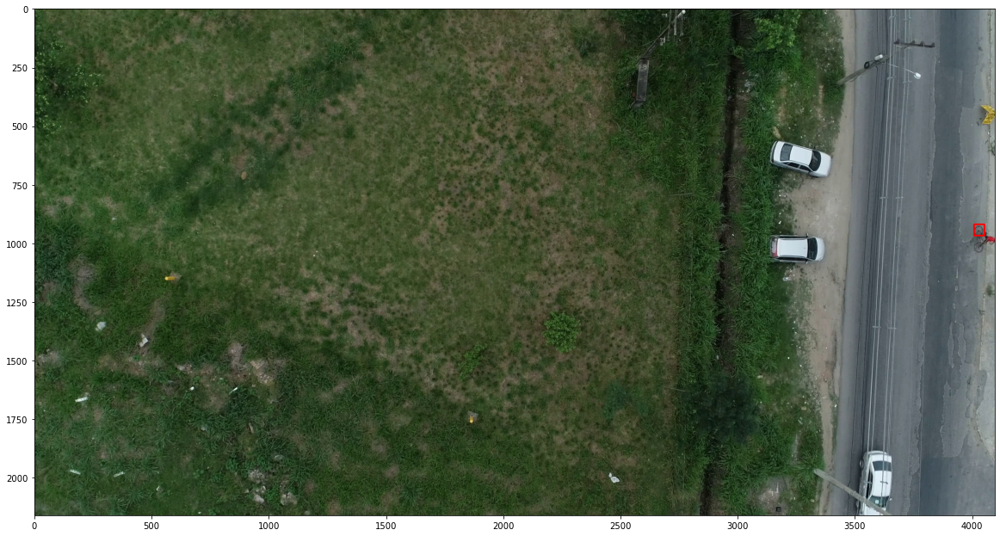

tensor([[3993.3428, 1280.6261,   44.8762,   46.8983]])


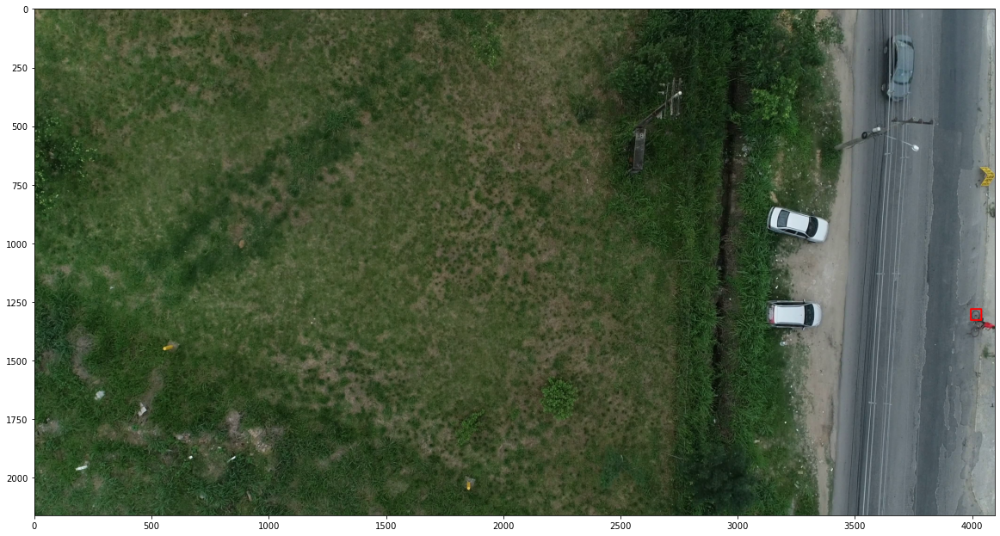

tensor([[1099.8331,  868.2603,   53.0428,   52.6830]])


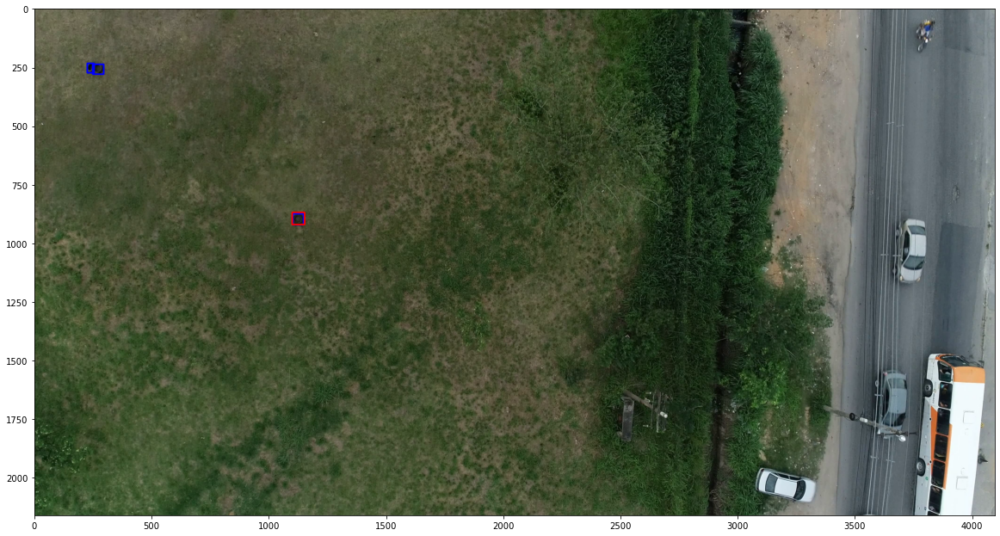

tensor([[1077.6099, 1449.3909,   54.7040,   53.9316]])


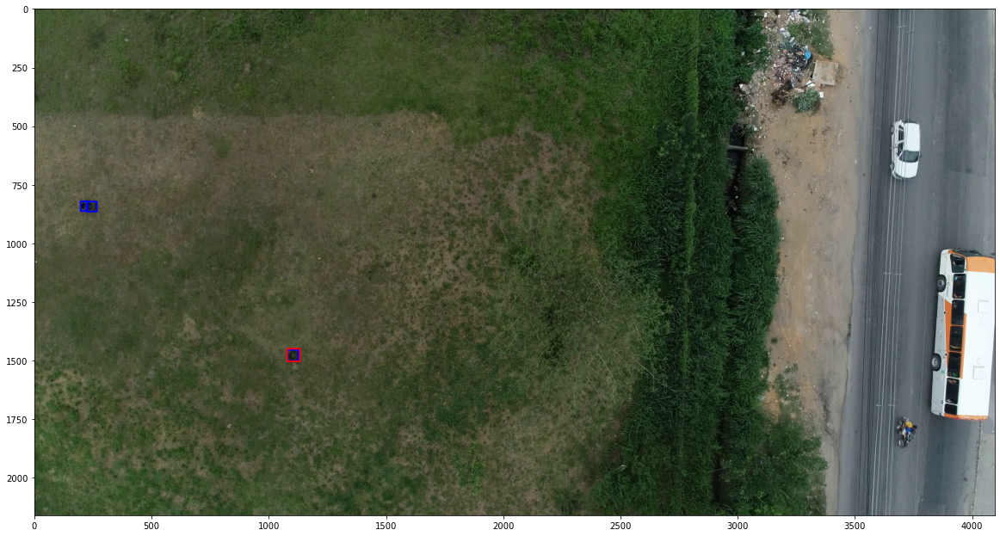

tensor([[1067.8489, 1739.5989,   55.0216,   55.6208]])


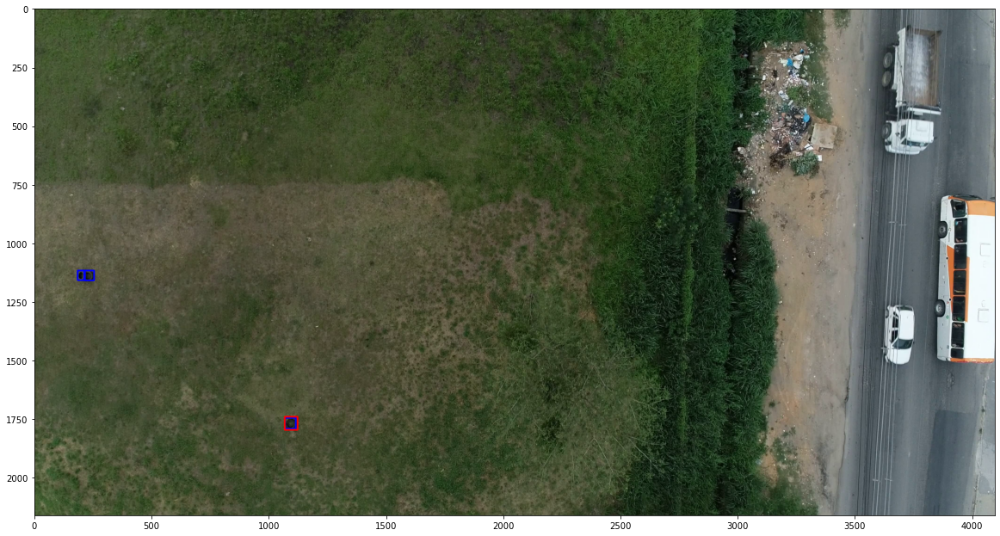

tensor([[1053.9282, 2029.0406,   55.5902,   55.8368]])


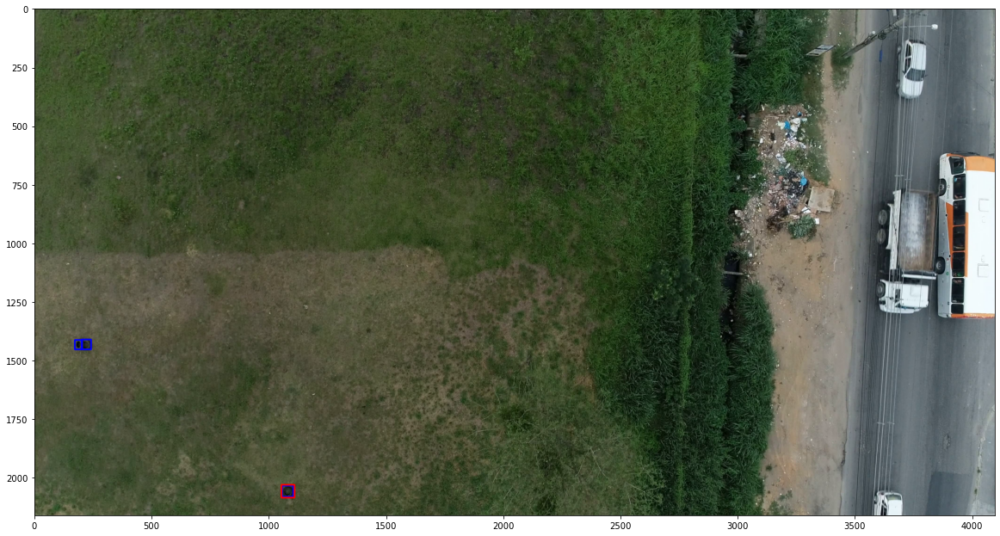

tensor([[ 161.2103, 1982.1572,   70.6333,   52.9879]])


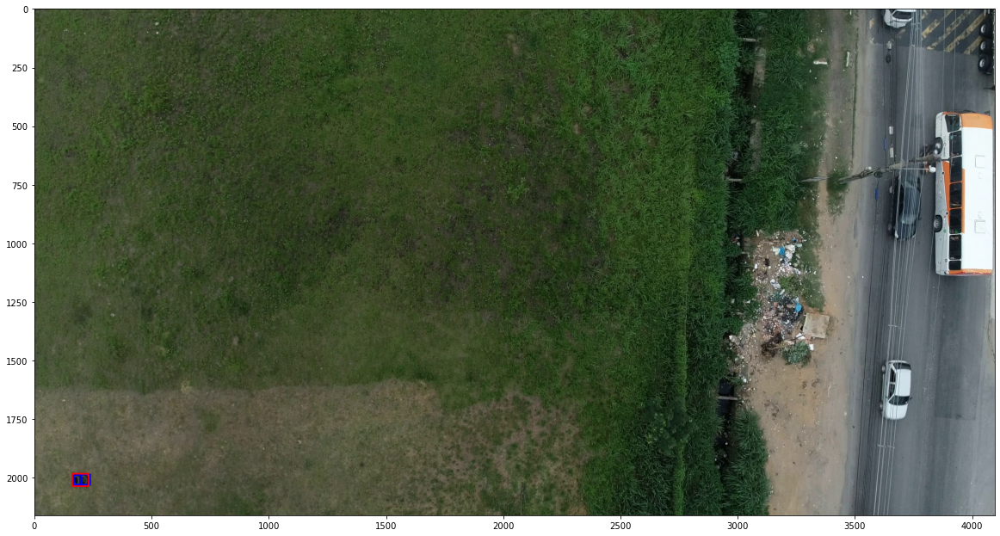

tensor([[3368.9609, 1605.7850,   61.6670,   54.2133]])


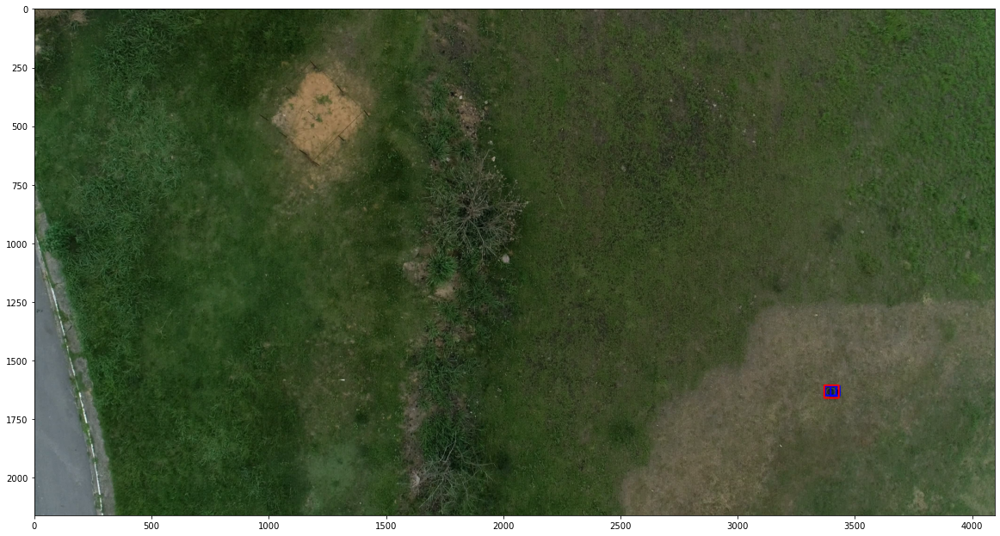

tensor([[3377.7607, 1327.3662,   64.7922,   51.8713]])


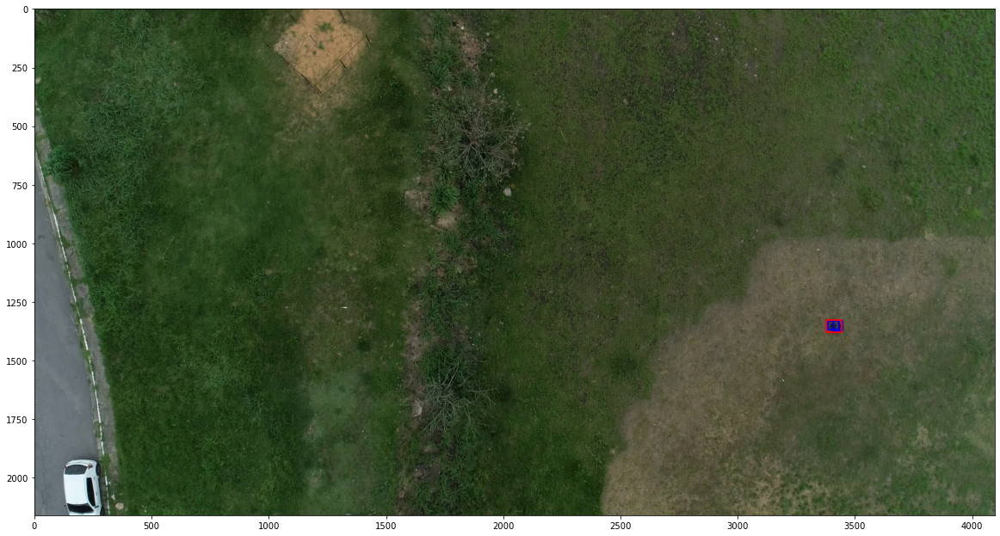

tensor([[3390.7581, 1047.1091,   63.8418,   50.8925]])


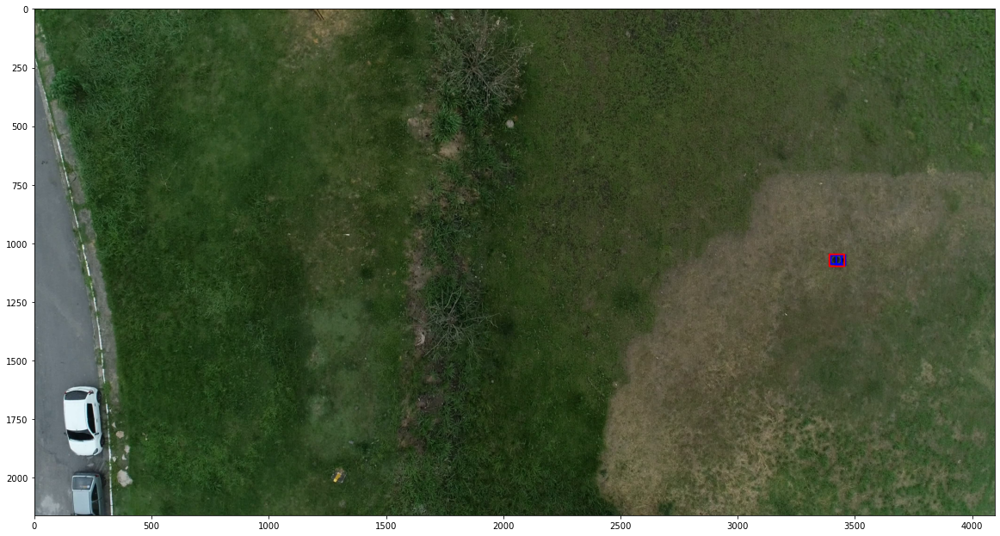

tensor([[3401.7769,  765.2428,   65.4922,   49.2986]])


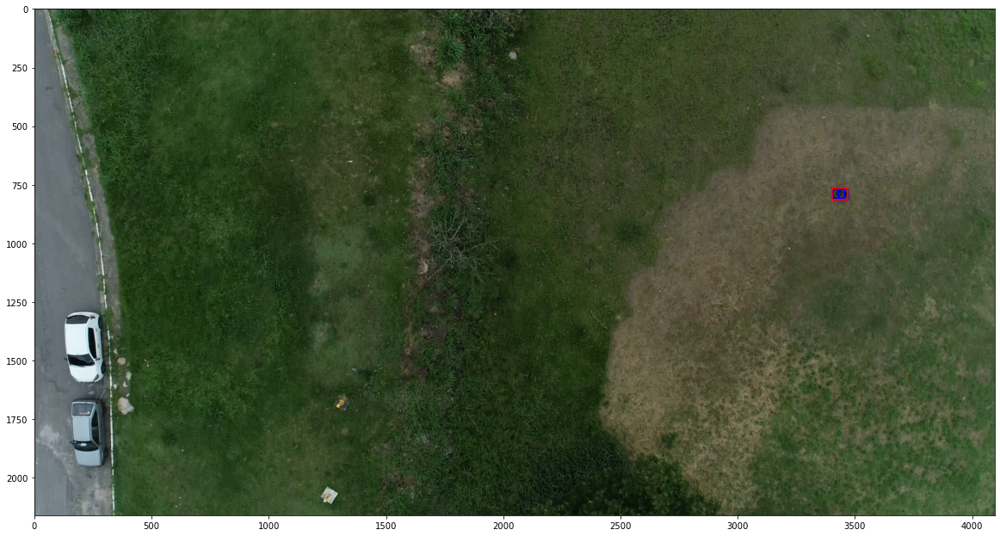

tensor([[3414.2070,  478.2428,   60.4343,   54.1511]])


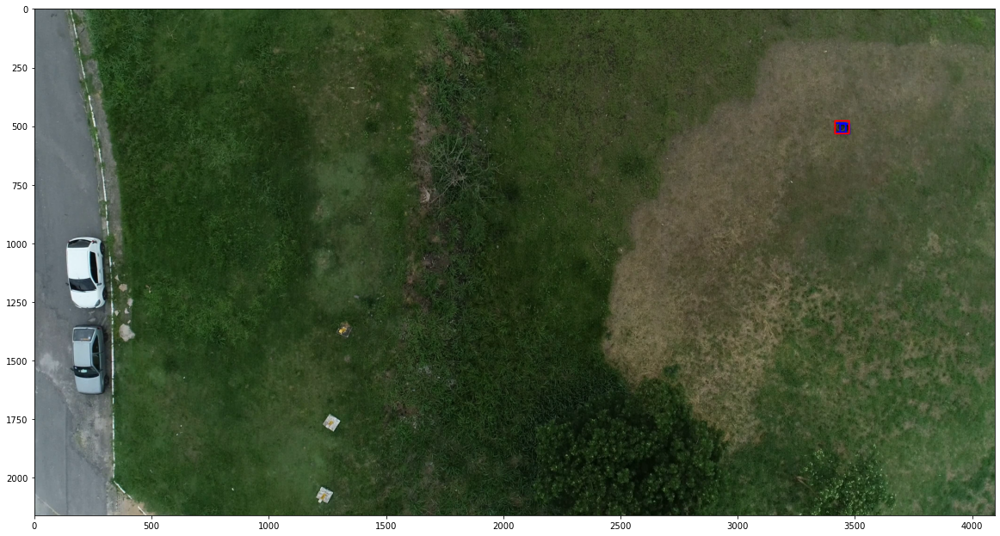

tensor([[1014.2222, 1988.9419,   62.2485,   57.5813]])


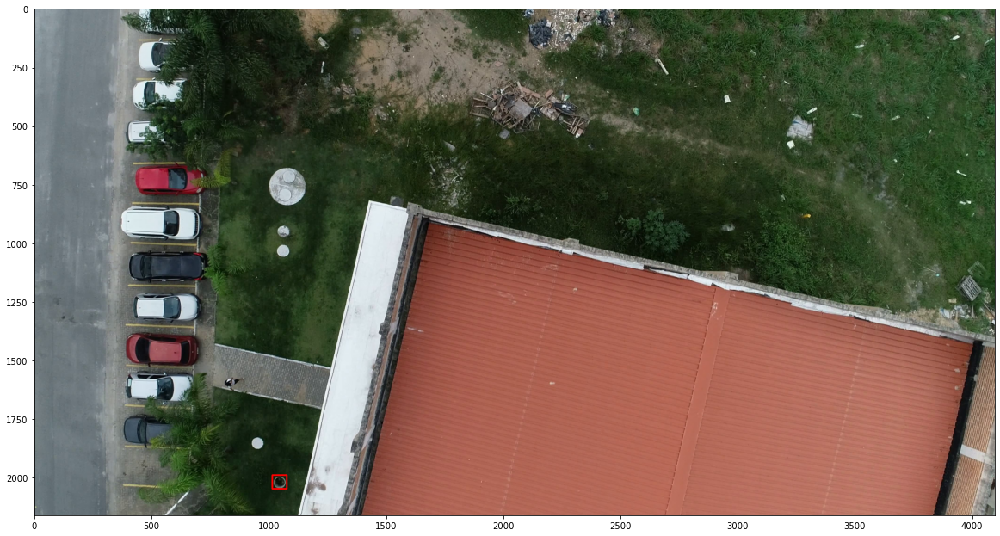

In [15]:
for sample in dataset_dicts_filter:
    r = get_res(sample)
    plt.figure(figsize=(20,18))
    plt.imshow(r)
    plt.show()